# Music Genre Clustering using Spotify Dataset

## 📊 Project Overview
Proyek ini melakukan analisis clustering pada dataset lagu Spotify untuk mengelompokkan lagu-lagu berdasarkan karakteristik audio mereka. Tujuannya adalah menemukan pola dan grup lagu yang memiliki kesamaan fitur musik.

---

## 📑 Table of Contents
1. [Import Libraries](#import-libraries)
2. [Load Dataset](#load-dataset)
3. [Deskripsi Dataset](#deskripsi-dataset)
4. [Exploratory Data Analysis (EDA)](#exploratory-data-analysis)
5. [Data Preprocessing](#data-preprocessing)
6. [Dimensionality Reduction & Feature Selection](#dimensionality-reduction)
7. [Clustering Modeling](#clustering-modeling)
8. [Post-Clustering Analysis & Visualization](#post-clustering-analysis)
9. [Conclusion](#conclusion)

---

<a id='import-libraries'></a>
## 1. Import Libraries

Import semua library yang diperlukan untuk analisis data, visualisasi, preprocessing, dan modeling.

In [2]:
# Data manipulation
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA

# Clustering
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import cdist

# Feature Selection
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestClassifier

# Utilities
import warnings
warnings.filterwarnings('ignore')

# Set visualization style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("✅ All libraries imported successfully!")

✅ All libraries imported successfully!


<a id='load-dataset'></a>
## 2. Load Dataset

Memuat dataset dari Kaggle menggunakan kagglehub. Dataset ini berisi informasi tentang lagu-lagu di Spotify beserta fitur-fitur audio mereka.

In [3]:
# Load dataset dari direktori lokal
import os

print("📥 Loading dataset dari direktori lokal...")

# Path ke dataset
dataset_path = "dataset.csv"

# Check if file exists
if os.path.exists(dataset_path):
    try:
        # Load dataset dengan handling encoding
        df = pd.read_csv(dataset_path, encoding='utf-8')
        print("✅ Dataset berhasil dimuat!")
        print(f"📊 Dataset shape: {df.shape[0]} rows × {df.shape[1]} columns")
    except UnicodeDecodeError:
        try:
            df = pd.read_csv(dataset_path, encoding='latin-1')
            print("✅ Dataset berhasil dimuat!")
            print(f"📊 Dataset shape: {df.shape[0]} rows × {df.shape[1]} columns")
        except Exception as e:
            print(f"❌ Error loading dataset: {e}")
            raise
    except Exception as e:
        print(f"❌ Error loading dataset: {e}")
        raise
else:
    print(f"❌ File '{dataset_path}' tidak ditemukan di direktori ini!")
    print(f"📂 Current directory: {os.getcwd()}")
    print("\n💡 Pastikan file 'dataset.csv' ada di direktori yang sama dengan notebook ini.")

📥 Loading dataset dari direktori lokal...
✅ Dataset berhasil dimuat!
📊 Dataset shape: 114000 rows × 21 columns
✅ Dataset berhasil dimuat!
📊 Dataset shape: 114000 rows × 21 columns


<a id='deskripsi-dataset'></a>
## 3. Deskripsi Dataset

Mari kita lihat struktur dataset, tipe data, dan informasi dasar lainnya.

In [4]:
# Tampilkan 5 baris pertama
print("=" * 80)
print("📋 PREVIEW DATASET (5 Baris Pertama)")
print("=" * 80)
df.head()

📋 PREVIEW DATASET (5 Baris Pertama)


,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [5]:
# Informasi dataset
print("=" * 80)
print("ℹ️  INFORMASI DATASET")
print("=" * 80)
df.info()

ℹ️  INFORMASI DATASET
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16

In [6]:
# Cek duplikat
print("=" * 80)
print("🔍 CEK DATA DUPLIKAT")
print("=" * 80)

duplicates = df.duplicated().sum()
print(f"Jumlah baris duplikat: {duplicates}")
if duplicates > 0:
    print(f"Persentase duplikat: {(duplicates/len(df)*100):.2f}%")
else:
    print("✅ Tidak ada data duplikat!")

🔍 CEK DATA DUPLIKAT
Jumlah baris duplikat: 0
✅ Tidak ada data duplikat!


In [7]:
# Statistik deskriptif
print("=" * 80)
print("📊 STATISTIK DESKRIPTIF")
print("=" * 80)
df.describe().T.style.background_gradient(cmap='coolwarm')

📊 STATISTIK DESKRIPTIF


,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,114000.000000,56999.500000,32909.109681,0.000000,28499.750000,56999.500000,85499.250000,113999.000000
popularity,114000.000000,33.238535,22.305078,0.000000,17.000000,35.000000,50.000000,100.000000
duration_ms,114000.000000,228029.153114,107297.712645,0.000000,174066.000000,212906.000000,261506.000000,5237295.000000
danceability,114000.000000,0.566800,0.173542,0.000000,0.456000,0.580000,0.695000,0.985000
energy,114000.000000,0.641383,0.251529,0.000000,0.472000,0.685000,0.854000,1.000000
key,114000.000000,5.309140,3.559987,0.000000,2.000000,5.000000,8.000000,11.000000
loudness,114000.000000,-8.258960,5.029337,-49.531000,-10.013000,-7.004000,-5.003000,4.532000
mode,114000.000000,0.637553,0.480709,0.000000,0.000000,1.000000,1.000000,1.000000
speechiness,114000.000000,0.084652,0.105732,0.000000,0.035900,0.048900,0.084500,0.965000
acousticness,114000.000000,0.314910,0.332523,0.000000,0.016900,0.169000,0.598000,0.996000


In [8]:
# Cek missing values
print("=" * 80)
print("🔍 CEK MISSING VALUES")
print("=" * 80)

missing = df.isnull().sum()
missing_percent = (missing / len(df)) * 100
missing_df = pd.DataFrame({
    'Column': missing.index,
    'Missing Count': missing.values,
    'Percentage': missing_percent.values
})
missing_df = missing_df[missing_df['Missing Count'] > 0].sort_values('Missing Count', ascending=False)

if len(missing_df) > 0:
    display(missing_df)
else:
    print("✅ Tidak ada missing values dalam dataset!")

🔍 CEK MISSING VALUES


,Column,Missing Count,Percentage
2,artists,1,0.000877
3,album_name,1,0.000877
4,track_name,1,0.000877


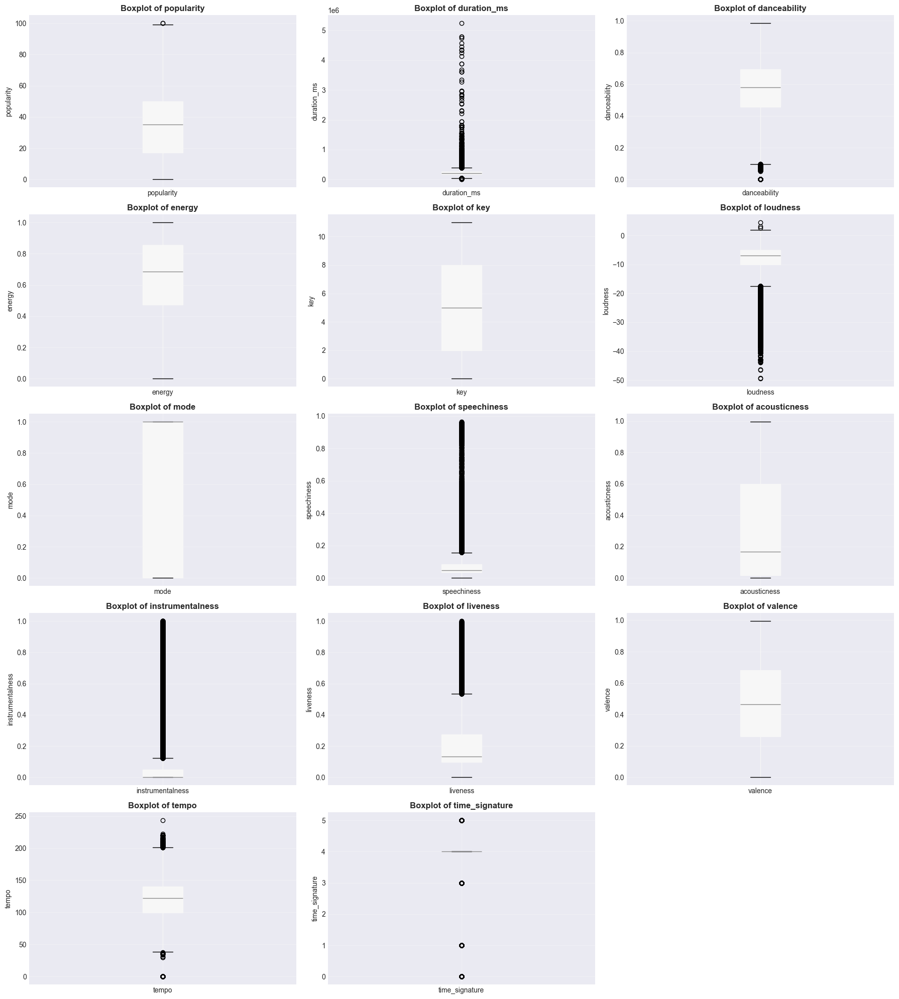

In [9]:
# Boxplot untuk deteksi outliers
# Identifikasi kolom numerik
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
audio_features = [col for col in numeric_cols if col.lower() not in ['unnamed: 0', 'year', 'release_date', 'id']]

if len(audio_features) > 0:
    n_cols = 3
    n_rows = (len(audio_features) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
    axes = axes.flatten() if n_rows > 1 else [axes]
    
    for idx, col in enumerate(audio_features):
        if idx < len(axes):
            df.boxplot(column=col, ax=axes[idx], patch_artist=True)
            axes[idx].set_title(f'Boxplot of {col}', fontsize=12, fontweight='bold')
            axes[idx].set_ylabel(col)
            axes[idx].grid(alpha=0.3)
    
    # Hide unused subplots
    for idx in range(len(audio_features), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

<a id='exploratory-data-analysis'></a>
## 4. Exploratory Data Analysis (EDA)

Melakukan analisis eksplorasi untuk memahami distribusi data, korelasi antar fitur, dan pola-pola yang ada.

### 4.1 Identifikasi Kolom Numerik dan Kategorikal

In [10]:
# Identifikasi tipe kolom
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

print("=" * 80)
print("📊 TIPE KOLOM")
print("=" * 80)
print(f"\n🔢 Kolom Numerik ({len(numeric_cols)}):")
print(numeric_cols)
print(f"\n📝 Kolom Kategorikal ({len(categorical_cols)}):")
print(categorical_cols)

📊 TIPE KOLOM

🔢 Kolom Numerik (15):
['Unnamed: 0', 'popularity', 'duration_ms', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']

📝 Kolom Kategorikal (5):
['track_id', 'artists', 'album_name', 'track_name', 'track_genre']


### 4.2 Distribusi Fitur Numerik

Visualisasi distribusi untuk setiap fitur numerik menggunakan histogram dan boxplot.

🎵 Audio Features untuk analisis: ['popularity', 'duration_ms', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']


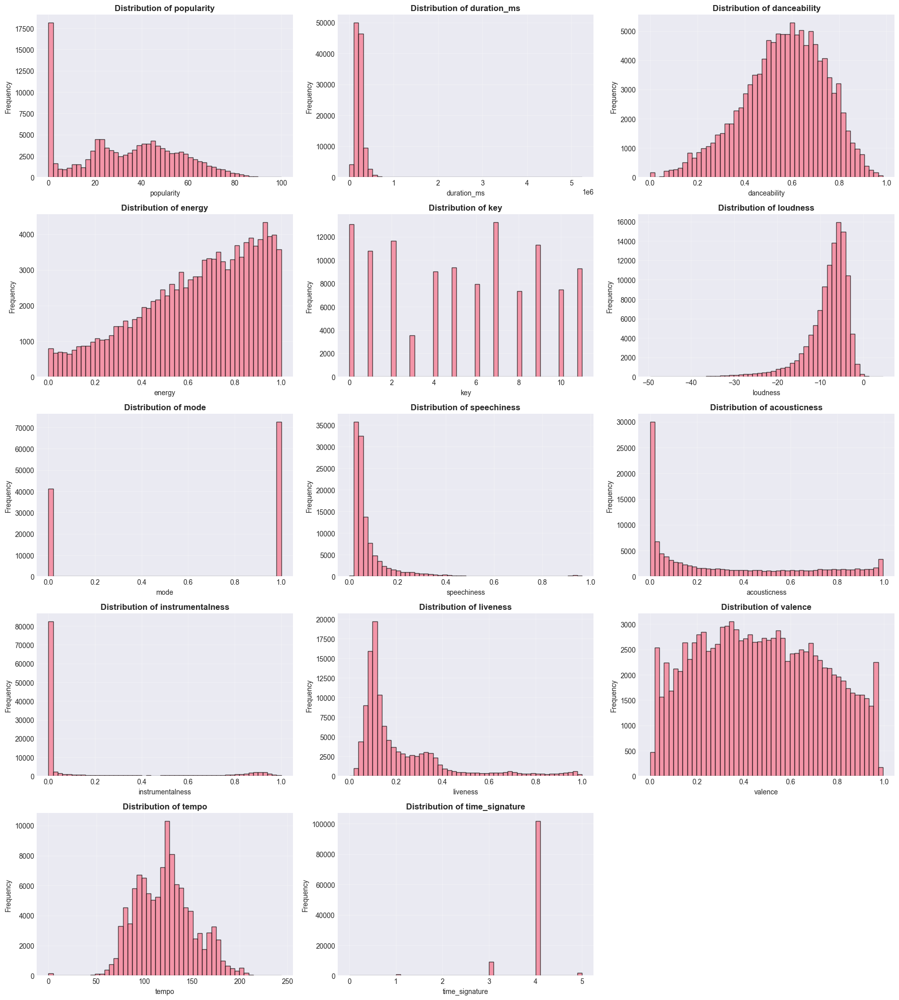

In [11]:
# Filter hanya kolom numerik yang relevan untuk clustering (exclude ID, year, etc jika ada)
# Identifikasi kolom audio features
audio_features = [col for col in numeric_cols if col.lower() not in ['unnamed: 0', 'year', 'release_date', 'id']]

print(f"🎵 Audio Features untuk analisis: {audio_features}")

# Visualisasi distribusi
if len(audio_features) > 0:
    n_cols = 3
    n_rows = (len(audio_features) + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, n_rows * 4))
    axes = axes.flatten() if n_rows > 1 else [axes]
    
    for idx, col in enumerate(audio_features):
        if idx < len(axes):
            df[col].hist(bins=50, ax=axes[idx], edgecolor='black', alpha=0.7)
            axes[idx].set_title(f'Distribution of {col}', fontsize=12, fontweight='bold')
            axes[idx].set_xlabel(col)
            axes[idx].set_ylabel('Frequency')
            axes[idx].grid(alpha=0.3)
    
    # Hide unused subplots
    for idx in range(len(audio_features), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ Tidak ada audio features numerik yang terdeteksi")

### 4.3 Analisis Korelasi

Melihat hubungan antara fitur-fitur audio menggunakan correlation matrix.

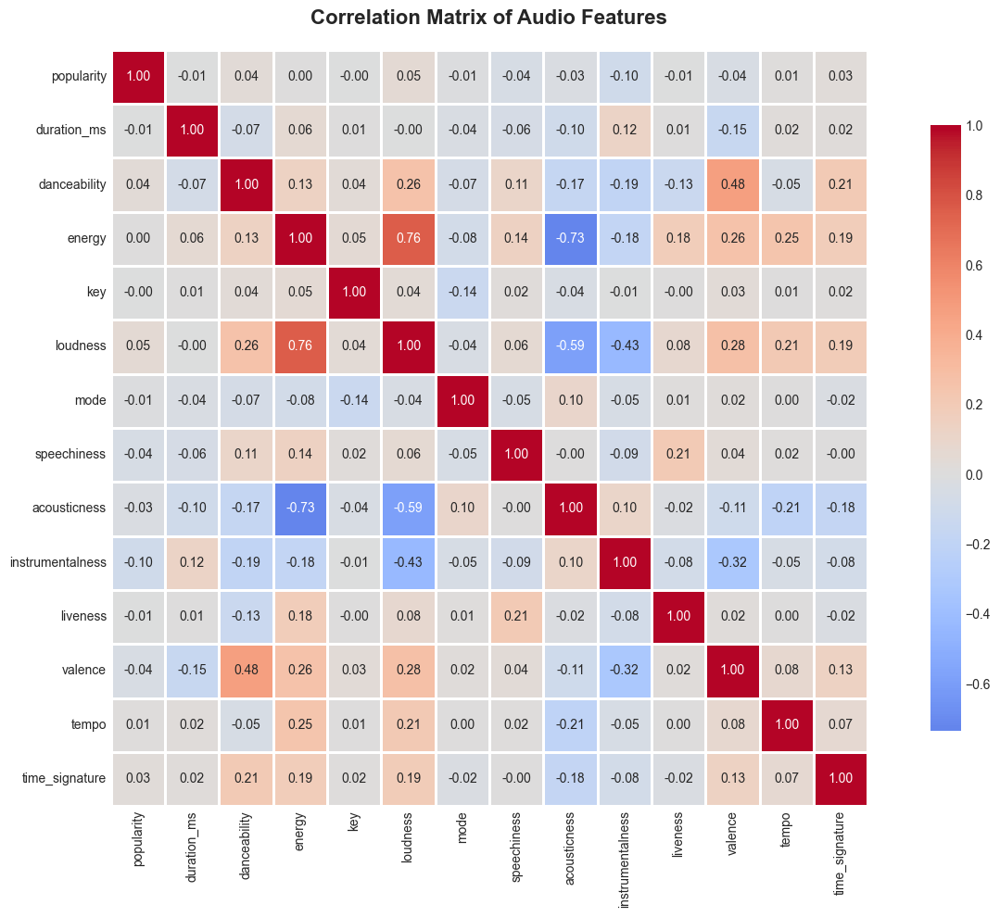


🔗 PASANGAN FITUR DENGAN KORELASI TINGGI (|r| > 0.7)


,Feature 1,Feature 2,Correlation
0,energy,loudness,0.761690
1,energy,acousticness,-0.733906


In [12]:
# Correlation matrix
if len(audio_features) > 0:
    correlation_matrix = df[audio_features].corr()
    
    # Visualisasi dengan heatmap
    plt.figure(figsize=(14, 10))
    sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', 
                center=0, square=True, linewidths=1, cbar_kws={"shrink": 0.8})
    plt.title('Correlation Matrix of Audio Features', fontsize=16, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()
    
    # Identifikasi korelasi tinggi
    print("\n" + "=" * 80)
    print("🔗 PASANGAN FITUR DENGAN KORELASI TINGGI (|r| > 0.7)")
    print("=" * 80)
    
    high_corr = []
    for i in range(len(correlation_matrix.columns)):
        for j in range(i+1, len(correlation_matrix.columns)):
            if abs(correlation_matrix.iloc[i, j]) > 0.7:
                high_corr.append({
                    'Feature 1': correlation_matrix.columns[i],
                    'Feature 2': correlation_matrix.columns[j],
                    'Correlation': correlation_matrix.iloc[i, j]
                })
    
    if high_corr:
        high_corr_df = pd.DataFrame(high_corr).sort_values('Correlation', ascending=False, key=abs)
        display(high_corr_df)
    else:
        print("✅ Tidak ada pasangan fitur dengan korelasi sangat tinggi (|r| > 0.7)")

### 4.4 Analisis Kategorikal (jika ada)

Melihat distribusi genre atau kategori lain jika tersedia dalam dataset.

📊 ANALISIS KOLOM KATEGORIKAL

🎵 Distribusi track_genre:
track_genre
acoustic       1000
afrobeat       1000
alt-rock       1000
alternative    1000
ambient        1000
anime          1000
black-metal    1000
bluegrass      1000
blues          1000
brazil         1000
Name: count, dtype: int64


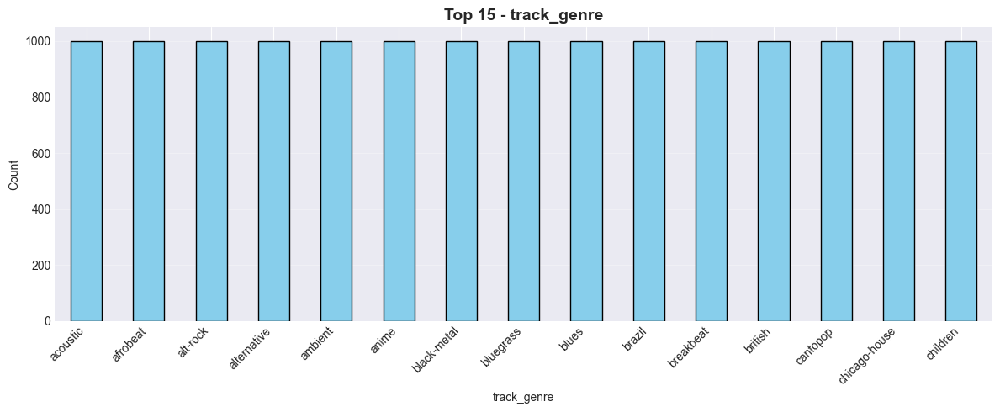

In [13]:
# Analisis kolom kategorikal
if len(categorical_cols) > 0:
    # Filter kolom kategorikal yang bukan ID atau nama
    relevant_categorical = [col for col in categorical_cols 
                           if col.lower() not in ['track_id', 'track_name', 'artists', 'album_name', 'id', 'name']]
    
    if len(relevant_categorical) > 0:
        print("=" * 80)
        print(f"📊 ANALISIS KOLOM KATEGORIKAL")
        print("=" * 80)
        
        for col in relevant_categorical[:3]:  # Batasi 3 kolom pertama
            print(f"\n🎵 Distribusi {col}:")
            value_counts = df[col].value_counts()
            print(value_counts.head(10))
            
            # Visualisasi top 15
            plt.figure(figsize=(12, 5))
            value_counts.head(15).plot(kind='bar', color='skyblue', edgecolor='black')
            plt.title(f'Top 15 - {col}', fontsize=14, fontweight='bold')
            plt.xlabel(col)
            plt.ylabel('Count')
            plt.xticks(rotation=45, ha='right')
            plt.grid(axis='y', alpha=0.3)
            plt.tight_layout()
            plt.show()
    else:
        print("ℹ️ Tidak ada kolom kategorikal relevan untuk divisualisasikan")
else:
    print("ℹ️ Tidak ada kolom kategorikal dalam dataset")

<a id='data-preprocessing'></a>
## 5. Data Preprocessing

Tahap preprocessing meliputi:
1. Handling missing values
2. Handling duplicates
3. Handling outliers
4. Feature selection
5. Feature scaling

### 5.1 Create Working Copy & Handle Missing Values

In [14]:
# Buat copy untuk preprocessing
df_clean = df.copy()

print("=" * 80)
print("🔧 PREPROCESSING - HANDLING MISSING VALUES")
print("=" * 80)
print(f"Shape sebelum: {df_clean.shape}")

# Handle missing values
if df_clean.isnull().sum().sum() > 0:
    # Drop rows dengan missing values (jika sedikit)
    missing_pct = (df_clean.isnull().sum().sum() / (df_clean.shape[0] * df_clean.shape[1])) * 100
    
    if missing_pct < 5:  # Jika missing < 5%, drop rows
        df_clean = df_clean.dropna()
        print(f"✅ Dropped rows dengan missing values (missing data < 5%)")
    else:
        # Impute dengan median untuk numerik
        for col in audio_features:
            if df_clean[col].isnull().sum() > 0:
                df_clean[col].fillna(df_clean[col].median(), inplace=True)
        print(f"✅ Imputed missing values dengan median")
else:
    print("✅ Tidak ada missing values")

print(f"Shape sesudah: {df_clean.shape}")

🔧 PREPROCESSING - HANDLING MISSING VALUES
Shape sebelum: (114000, 21)
✅ Dropped rows dengan missing values (missing data < 5%)
Shape sesudah: (113999, 21)
✅ Dropped rows dengan missing values (missing data < 5%)
Shape sesudah: (113999, 21)


### 5.2 Handle Duplicates

In [15]:
print("=" * 80)
print("🔧 PREPROCESSING - HANDLING DUPLICATES")
print("=" * 80)
print(f"Shape sebelum: {df_clean.shape}")

duplicates_before = df_clean.duplicated().sum()
if duplicates_before > 0:
    df_clean = df_clean.drop_duplicates()
    print(f"✅ Removed {duplicates_before} duplicate rows")
else:
    print("✅ Tidak ada duplicates")

print(f"Shape sesudah: {df_clean.shape}")

🔧 PREPROCESSING - HANDLING DUPLICATES
Shape sebelum: (113999, 21)
✅ Tidak ada duplicates
Shape sesudah: (113999, 21)


### 5.3 Handle Outliers

Menggunakan IQR method untuk deteksi dan handling outliers. Untuk clustering, kita akan menggunakan capping method agar tidak kehilangan terlalu banyak data.

In [16]:
print("=" * 80)
print("🔧 PREPROCESSING - HANDLING OUTLIERS (IQR METHOD)")
print("=" * 80)

def detect_outliers_iqr(data, column):
    """Detect outliers using IQR method"""
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return len(outliers), lower_bound, upper_bound

# Deteksi outliers
outlier_summary = []
for col in audio_features:
    n_outliers, lower, upper = detect_outliers_iqr(df_clean, col)
    outlier_pct = (n_outliers / len(df_clean)) * 100
    outlier_summary.append({
        'Feature': col,
        'Outliers': n_outliers,
        'Percentage': f"{outlier_pct:.2f}%",
        'Lower Bound': lower,
        'Upper Bound': upper
    })

outlier_df = pd.DataFrame(outlier_summary).sort_values('Outliers', ascending=False)
print("\n📊 Outlier Summary:")
display(outlier_df)

# Capping outliers (winsorization)
print("\n🔧 Applying capping method untuk handling outliers...")
for col in audio_features:
    Q1 = df_clean[col].quantile(0.25)
    Q3 = df_clean[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Cap outliers
    df_clean[col] = df_clean[col].clip(lower=lower_bound, upper=upper_bound)

print("✅ Outliers telah di-cap menggunakan IQR bounds")

🔧 PREPROCESSING - HANDLING OUTLIERS (IQR METHOD)

📊 Outlier Summary:

📊 Outlier Summary:


,Feature,Outliers,Percentage,Lower Bound,Upper Bound
9,instrumentalness,25246,22.15%,-0.07350,0.12250
7,speechiness,13211,11.59%,-0.03700,0.15740
13,time_signature,12157,10.66%,4.00000,4.00000
10,liveness,8642,7.58%,-0.16450,0.53550
5,loudness,6173,5.41%,-17.52800,2.51200
1,duration_ms,5616,4.93%,42906.00000,392666.00000
2,danceability,620,0.54%,0.09750,1.05350
12,tempo,617,0.54%,37.93975,201.34975
0,popularity,2,0.00%,-32.50000,99.50000
3,energy,0,0.00%,-0.10100,1.42700



🔧 Applying capping method untuk handling outliers...
✅ Outliers telah di-cap menggunakan IQR bounds
✅ Outliers telah di-cap menggunakan IQR bounds


### 5.4 Select Features untuk Clustering

Memilih hanya fitur audio yang relevan untuk clustering (exclude ID, name, dll).

In [17]:
print("=" * 80)
print("🎯 FEATURE SELECTION")
print("=" * 80)

# Select only audio features for clustering
features_for_clustering = audio_features.copy()

print(f"\n📊 Features yang akan digunakan untuk clustering ({len(features_for_clustering)}):")
print(features_for_clustering)

# Create feature matrix
X = df_clean[features_for_clustering].copy()

print(f"\n✅ Feature matrix shape: {X.shape}")
print(f"   - Jumlah sampel: {X.shape[0]}")
print(f"   - Jumlah fitur: {X.shape[1]}")

🎯 FEATURE SELECTION

📊 Features yang akan digunakan untuk clustering (14):
['popularity', 'duration_ms', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']

✅ Feature matrix shape: (113999, 14)
   - Jumlah sampel: 113999
   - Jumlah fitur: 14


### 5.5 Feature Scaling

Normalisasi fitur menggunakan StandardScaler agar semua fitur memiliki skala yang sama. Ini penting untuk algoritma clustering yang berbasis jarak.

In [18]:
print("=" * 80)
print("⚖️  FEATURE SCALING")
print("=" * 80)

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Convert back to DataFrame untuk mudah dipahami
X_scaled_df = pd.DataFrame(X_scaled, columns=features_for_clustering, index=X.index)

print(f"✅ Features telah di-scale menggunakan StandardScaler")
print(f"\n📊 Statistik setelah scaling:")
print(X_scaled_df.describe().T[['mean', 'std', 'min', 'max']])

⚖️  FEATURE SCALING
✅ Features telah di-scale menggunakan StandardScaler

📊 Statistik setelah scaling:
                          mean       std       min       max
popularity       -7.978094e-18  1.000004 -1.490207  2.970709
duration_ms      -1.136878e-16  1.000004 -2.455704  2.326651
danceability      2.493154e-16  1.000004 -2.715293  2.417278
energy            1.954633e-16  1.000004 -2.549938  1.425747
key               1.844934e-17  1.000004 -1.491334  1.598568
loudness          1.495893e-16  1.000004 -2.389194  2.605655
mode             -7.579189e-17  1.000004 -1.326297  0.753979
speechiness      -5.185761e-17  1.000004 -1.580942  2.122977
acousticness     -7.978094e-18  1.000004 -0.947029  2.048272
instrumentalness -4.786856e-17  1.000004 -0.606681  1.794977
liveness          3.689868e-17  1.000004 -1.396874  2.408205
valence          -1.595619e-17  1.000004 -1.828535  2.009312
tempo            -1.037152e-16  1.000004 -2.832140  2.661547
time_signature    0.000000e+00  0.000000  0

<a id='dimensionality-reduction'></a>
## 6. Dimensionality Reduction (PCA) & Feature Selection

Mengurangi dimensi data untuk visualisasi dan meningkatkan efisiensi komputasi, sambil mempertahankan variance yang signifikan.

### 6.1 Variance Threshold

Menghapus fitur dengan variance rendah (jika ada) yang tidak memberikan informasi berguna.

In [19]:
print("=" * 80)
print("🔍 VARIANCE THRESHOLD")
print("=" * 80)

# Check variance of each feature
variances = X_scaled_df.var().sort_values()
print("\n📊 Variance dari setiap fitur (setelah scaling):")
print(variances)

# Apply variance threshold (threshold = 0.01)
variance_threshold = 0.01
selector = VarianceThreshold(threshold=variance_threshold)
X_var_filtered = selector.fit_transform(X_scaled)

# Get selected features
selected_mask = selector.get_support()
selected_features = [feat for feat, selected in zip(features_for_clustering, selected_mask) if selected]
removed_features = [feat for feat, selected in zip(features_for_clustering, selected_mask) if not selected]

print(f"\n✅ Features dengan variance > {variance_threshold}: {len(selected_features)}")
if removed_features:
    print(f"❌ Removed features dengan low variance: {removed_features}")
else:
    print(f"✅ Semua features memiliki variance yang cukup")

# Use all features if variance threshold doesn't remove any
if len(selected_features) == len(features_for_clustering):
    X_for_pca = X_scaled
    final_features = features_for_clustering
else:
    X_for_pca = X_var_filtered
    final_features = selected_features

print(f"\n📊 Shape setelah variance filtering: {X_for_pca.shape}")

🔍 VARIANCE THRESHOLD

📊 Variance dari setiap fitur (setelah scaling):
time_signature      0.000000
popularity          1.000009
tempo               1.000009
duration_ms         1.000009
key                 1.000009
loudness            1.000009
danceability        1.000009
energy              1.000009
valence             1.000009
speechiness         1.000009
acousticness        1.000009
instrumentalness    1.000009
liveness            1.000009
mode                1.000009
dtype: float64

✅ Features dengan variance > 0.01: 13
❌ Removed features dengan low variance: ['time_signature']

📊 Shape setelah variance filtering: (113999, 13)


### 6.2 Principal Component Analysis (PCA)

Menerapkan PCA untuk reduksi dimensi dan visualisasi. Kita akan melihat berapa banyak komponen yang diperlukan untuk menjelaskan 90-95% variance.

🔬 PRINCIPAL COMPONENT ANALYSIS (PCA)


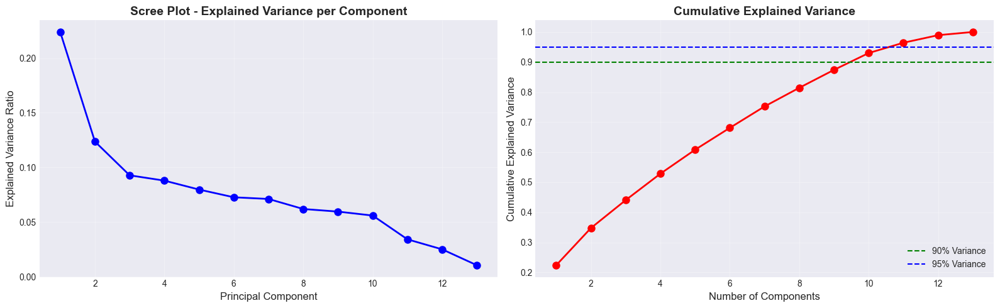


📊 PCA Analysis:
   - Jumlah komponen untuk 90% variance: 10
   - Jumlah komponen untuk 95% variance: 11
   - Total variance dijelaskan oleh 10 komponen: 0.9300
   - Total variance dijelaskan oleh 11 komponen: 0.9642


In [20]:
print("=" * 80)
print("🔬 PRINCIPAL COMPONENT ANALYSIS (PCA)")
print("=" * 80)

# Fit PCA dengan semua komponen terlebih dahulu untuk melihat explained variance
pca_full = PCA()
pca_full.fit(X_for_pca)

# Explained variance ratio
explained_variance = pca_full.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

# Visualisasi Scree Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

# Scree plot
ax1.plot(range(1, len(explained_variance) + 1), explained_variance, 'bo-', linewidth=2, markersize=8)
ax1.set_xlabel('Principal Component', fontsize=12)
ax1.set_ylabel('Explained Variance Ratio', fontsize=12)
ax1.set_title('Scree Plot - Explained Variance per Component', fontsize=14, fontweight='bold')
ax1.grid(alpha=0.3)

# Cumulative variance
ax2.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'ro-', linewidth=2, markersize=8)
ax2.axhline(y=0.90, color='g', linestyle='--', label='90% Variance')
ax2.axhline(y=0.95, color='b', linestyle='--', label='95% Variance')
ax2.set_xlabel('Number of Components', fontsize=12)
ax2.set_ylabel('Cumulative Explained Variance', fontsize=12)
ax2.set_title('Cumulative Explained Variance', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Find number of components for 90% and 95% variance
n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1

print(f"\n📊 PCA Analysis:")
print(f"   - Jumlah komponen untuk 90% variance: {n_components_90}")
print(f"   - Jumlah komponen untuk 95% variance: {n_components_95}")
print(f"   - Total variance dijelaskan oleh {n_components_90} komponen: {cumulative_variance[n_components_90-1]:.4f}")
print(f"   - Total variance dijelaskan oleh {n_components_95} komponen: {cumulative_variance[n_components_95-1]:.4f}")

In [21]:
# Apply PCA dengan optimal n_components (95% variance)
n_components_optimal = n_components_95

print(f"\n🎯 Applying PCA dengan {n_components_optimal} components...")
pca = PCA(n_components=n_components_optimal)
X_pca = pca.fit_transform(X_for_pca)

print(f"✅ PCA completed!")
print(f"   - Original shape: {X_for_pca.shape}")
print(f"   - PCA shape: {X_pca.shape}")
print(f"   - Variance retained: {cumulative_variance[n_components_optimal-1]:.4f}")

# Create DataFrame untuk PCA results
pca_columns = [f'PC{i+1}' for i in range(n_components_optimal)]
X_pca_df = pd.DataFrame(X_pca, columns=pca_columns, index=X_scaled_df.index)


🎯 Applying PCA dengan 11 components...
✅ PCA completed!
   - Original shape: (113999, 13)
   - PCA shape: (113999, 11)
   - Variance retained: 0.9642


🔬 PCA COMPONENT LOADINGS

📊 Top 3 Principal Components dan kontribusi fitur:


,PC1,PC2,PC3
popularity,0.025255,0.019692,0.016444
duration_ms,0.011601,-0.431494,-0.205520
danceability,0.224679,0.456890,-0.367046
energy,0.519023,-0.214185,0.049192
key,0.052511,-0.019629,-0.442307
loudness,0.506664,-0.061815,0.084038
mode,-0.067922,0.113875,0.559420
speechiness,0.221008,0.030366,0.009730
acousticness,-0.447534,0.275292,0.095277
instrumentalness,-0.208964,-0.396829,-0.257191


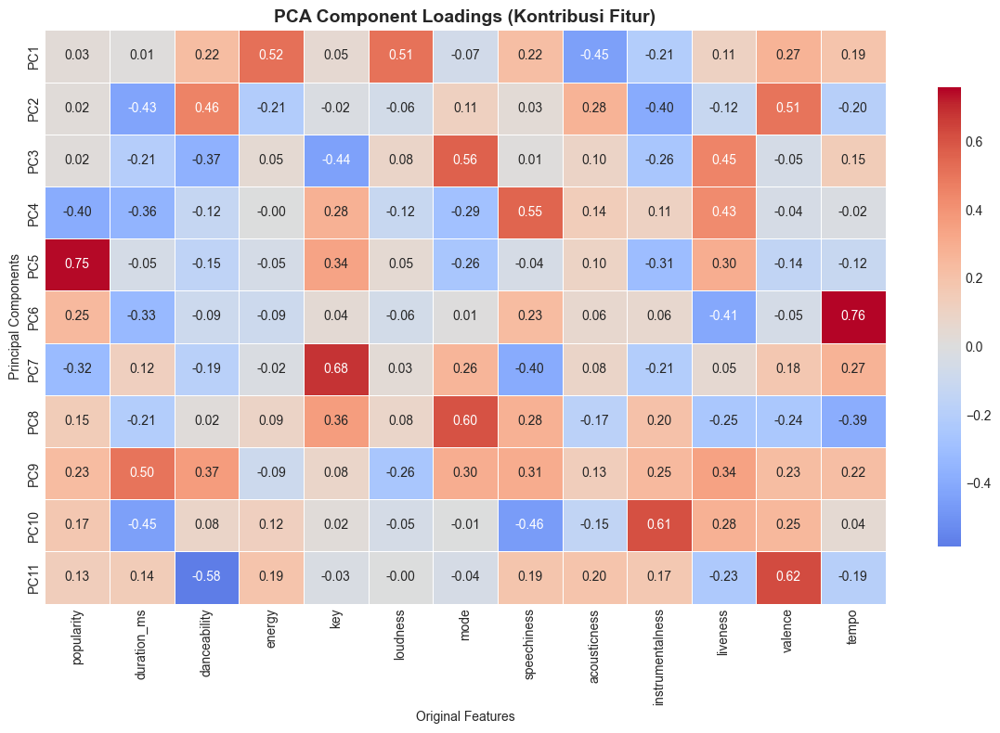

In [22]:
# PCA Components (loadings)
components_df = pd.DataFrame(
    pca.components_.T,
    columns=pca_columns,
    index=final_features
)

print("=" * 80)
print("🔬 PCA COMPONENT LOADINGS")
print("=" * 80)
print("\n📊 Top 3 Principal Components dan kontribusi fitur:")
display(components_df.iloc[:, :min(3, n_components_optimal)].style.background_gradient(cmap='coolwarm', axis=0))

# Visualisasi heatmap untuk loadings
plt.figure(figsize=(12, max(8, len(final_features) * 0.4)))
sns.heatmap(components_df.T, cmap='coolwarm', center=0, annot=True, fmt='.2f', 
            linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.title('PCA Component Loadings (Kontribusi Fitur)', fontsize=14, fontweight='bold')
plt.xlabel('Original Features')
plt.ylabel('Principal Components')
plt.tight_layout()
plt.show()

### 6.3 PCA Component Analysis

Melihat kontribusi fitur asli terhadap principal components.

<a id='clustering-modeling'></a>
## 7. Clustering Modeling

Menerapkan berbagai algoritma clustering dan menentukan jumlah cluster optimal menggunakan metrik evaluasi.

### 7.1 Elbow Method untuk Menentukan Jumlah Cluster Optimal

Menggunakan metode elbow dengan Within-Cluster Sum of Squares (WCSS) untuk menemukan jumlah cluster yang optimal.

📈 ELBOW METHOD - Mencari Jumlah Cluster Optimal

🔍 Evaluating: Original Features (Scaled)
   ✅ Suggested elbow point: k = 2

🔍 Evaluating: PCA Features
   ✅ Suggested elbow point: k = 2

🔍 Evaluating: PCA Features
   ✅ Suggested elbow point: k = 2
   ✅ Suggested elbow point: k = 2


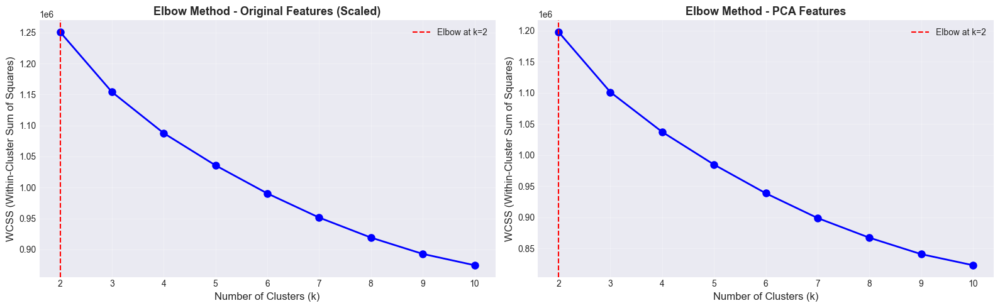


💡 Interpretasi: Elbow point menunjukkan titik di mana penambahan cluster
   tidak memberikan peningkatan signifikan dalam mengurangi WCSS.


In [23]:
print("=" * 80)
print("📈 ELBOW METHOD - Mencari Jumlah Cluster Optimal")
print("=" * 80)

# Test dengan data original (scaled) dan PCA
datasets = {
    'Original Features (Scaled)': X_scaled,
    'PCA Features': X_pca
}

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

for idx, (name, data) in enumerate(datasets.items()):
    print(f"\n🔍 Evaluating: {name}")
    
    # Range of clusters to test
    k_range = range(2, 11)
    wcss = []
    
    for k in k_range:
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
        kmeans.fit(data)
        wcss.append(kmeans.inertia_)
    
    # Plot elbow curve
    axes[idx].plot(k_range, wcss, 'bo-', linewidth=2, markersize=8)
    axes[idx].set_xlabel('Number of Clusters (k)', fontsize=12)
    axes[idx].set_ylabel('WCSS (Within-Cluster Sum of Squares)', fontsize=12)
    axes[idx].set_title(f'Elbow Method - {name}', fontsize=13, fontweight='bold')
    axes[idx].grid(alpha=0.3)
    
    # Calculate elbow point using the "knee" method
    # Calculate rate of decrease
    decreases = np.diff(wcss)
    second_decreases = np.diff(decreases)
    elbow_point = np.argmax(second_decreases) + 2  # +2 because of double diff and 0-indexing
    
    axes[idx].axvline(x=elbow_point, color='r', linestyle='--', 
                      label=f'Elbow at k={elbow_point}')
    axes[idx].legend()
    
    print(f"   ✅ Suggested elbow point: k = {elbow_point}")

plt.tight_layout()
plt.show()

print("\n" + "=" * 80)
print("💡 Interpretasi: Elbow point menunjukkan titik di mana penambahan cluster")
print("   tidak memberikan peningkatan signifikan dalam mengurangi WCSS.")
print("=" * 80)

### 7.2 Silhouette Analysis

Menggunakan Silhouette Score untuk mengevaluasi kualitas clustering dengan berbagai jumlah cluster.

📊 SILHOUETTE ANALYSIS

🔍 Evaluating: Original Features (Scaled)
   k=2: Silhouette Score = 0.1724
   k=2: Silhouette Score = 0.1724
   k=3: Silhouette Score = 0.1141
   k=3: Silhouette Score = 0.1141
   k=4: Silhouette Score = 0.1163
   k=4: Silhouette Score = 0.1163
   k=5: Silhouette Score = 0.1097
   k=5: Silhouette Score = 0.1097
   k=6: Silhouette Score = 0.1001
   k=6: Silhouette Score = 0.1001
   k=7: Silhouette Score = 0.0986
   k=7: Silhouette Score = 0.0986
   k=8: Silhouette Score = 0.1009
   k=8: Silhouette Score = 0.1009
   k=9: Silhouette Score = 0.0949
   k=9: Silhouette Score = 0.0949
   k=10: Silhouette Score = 0.0964
   ✅ Best Silhouette Score: k = 2 dengan score = 0.1724

🔍 Evaluating: PCA Features
   k=10: Silhouette Score = 0.0964
   ✅ Best Silhouette Score: k = 2 dengan score = 0.1724

🔍 Evaluating: PCA Features
   k=2: Silhouette Score = 0.1761
   k=2: Silhouette Score = 0.1761
   k=3: Silhouette Score = 0.1183
   k=3: Silhouette Score = 0.1183
   k=4: Silhouette

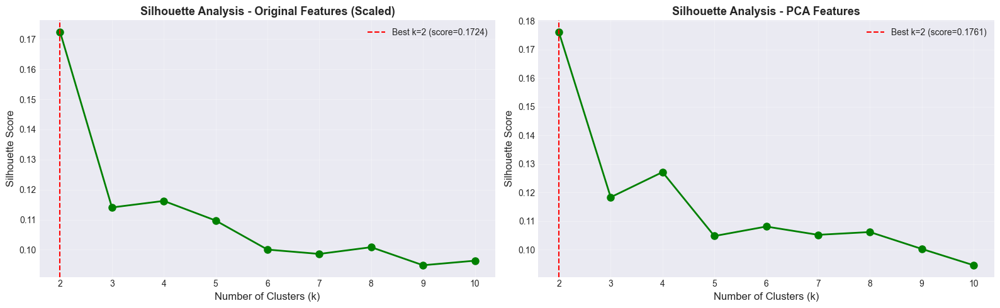


💡 Interpretasi: Silhouette Score berkisar dari -1 hingga 1
   - Score mendekati 1: Cluster terpisah dengan baik
   - Score mendekati 0: Cluster overlap
   - Score negatif: Data mungkin salah cluster


In [24]:
print("=" * 80)
print("📊 SILHOUETTE ANALYSIS")
print("=" * 80)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

for idx, (name, data) in enumerate(datasets.items()):
    print(f"\n🔍 Evaluating: {name}")
    
    k_range = range(2, 11)
    silhouette_scores = []
    
    for k in k_range:
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
        labels = kmeans.fit_predict(data)
        score = silhouette_score(data, labels)
        silhouette_scores.append(score)
        print(f"   k={k}: Silhouette Score = {score:.4f}")
    
    # Plot silhouette scores
    axes[idx].plot(k_range, silhouette_scores, 'go-', linewidth=2, markersize=8)
    axes[idx].set_xlabel('Number of Clusters (k)', fontsize=12)
    axes[idx].set_ylabel('Silhouette Score', fontsize=12)
    axes[idx].set_title(f'Silhouette Analysis - {name}', fontsize=13, fontweight='bold')
    axes[idx].grid(alpha=0.3)
    
    # Mark best score
    best_k = k_range[np.argmax(silhouette_scores)]
    best_score = max(silhouette_scores)
    axes[idx].axvline(x=best_k, color='r', linestyle='--', 
                      label=f'Best k={best_k} (score={best_score:.4f})')
    axes[idx].legend()
    
    print(f"   ✅ Best Silhouette Score: k = {best_k} dengan score = {best_score:.4f}")

plt.tight_layout()
plt.show()

print("\n" + "=" * 80)
print("💡 Interpretasi: Silhouette Score berkisar dari -1 hingga 1")
print("   - Score mendekati 1: Cluster terpisah dengan baik")
print("   - Score mendekati 0: Cluster overlap")
print("   - Score negatif: Data mungkin salah cluster")
print("=" * 80)

### 7.3 Multiple Evaluation Metrics

Menggunakan berbagai metrik evaluasi clustering untuk membandingkan kualitas dengan jumlah cluster berbeda.

📊 COMPREHENSIVE CLUSTERING EVALUATION

🔍 Evaluating clustering quality dengan berbagai metrik...

📊 Evaluation Results:

📊 Evaluation Results:


,k,Silhouette Score,Davies-Bouldin Index,Calinski-Harabasz Index
0,2,0.176110,1.991572,21973.210774
1,3,0.118349,2.450854,16956.415765
2,4,0.127133,2.298104,14346.636232
3,5,0.104794,2.305835,12853.825642
4,6,0.108104,2.192777,11911.158136
5,7,0.105212,2.118315,11207.420881
6,8,0.106187,2.074321,10551.058957
7,9,0.100291,2.037811,9971.257517
8,10,0.094587,2.027033,9329.438971


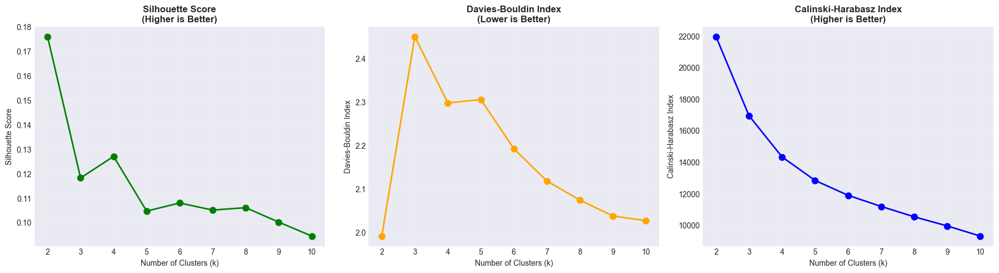


💡 Interpretasi Metrik:
   - Silhouette Score: Mengukur seberapa mirip objek dengan cluster-nya
     dibanding cluster lain. Range [-1, 1], semakin tinggi semakin baik.
   - Davies-Bouldin Index: Rasio rata-rata similarity antara cluster.
     Semakin rendah semakin baik (cluster lebih terpisah).
   - Calinski-Harabasz Index: Rasio between-cluster ke within-cluster dispersion.
     Semakin tinggi semakin baik (cluster lebih padat dan terpisah).


In [25]:
print("=" * 80)
print("📊 COMPREHENSIVE CLUSTERING EVALUATION")
print("=" * 80)

# Evaluate dengan PCA features (lebih efisien)
k_range = range(2, 11)
evaluation_results = []

print("\n🔍 Evaluating clustering quality dengan berbagai metrik...")
for k in k_range:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca)
    
    # Calculate metrics
    silhouette = silhouette_score(X_pca, labels)
    davies_bouldin = davies_bouldin_score(X_pca, labels)
    calinski_harabasz = calinski_harabasz_score(X_pca, labels)
    
    evaluation_results.append({
        'k': k,
        'Silhouette Score': silhouette,
        'Davies-Bouldin Index': davies_bouldin,
        'Calinski-Harabasz Index': calinski_harabasz
    })

eval_df = pd.DataFrame(evaluation_results)
print("\n📊 Evaluation Results:")
display(eval_df.style.background_gradient(cmap='RdYlGn', subset=['Silhouette Score', 'Calinski-Harabasz Index'])
                     .background_gradient(cmap='RdYlGn_r', subset=['Davies-Bouldin Index']))

# Visualisasi metrics
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Silhouette Score (higher is better)
axes[0].plot(eval_df['k'], eval_df['Silhouette Score'], 'o-', linewidth=2, markersize=8, color='green')
axes[0].set_xlabel('Number of Clusters (k)')
axes[0].set_ylabel('Silhouette Score')
axes[0].set_title('Silhouette Score\n(Higher is Better)', fontweight='bold')
axes[0].grid(alpha=0.3)

# Davies-Bouldin Index (lower is better)
axes[1].plot(eval_df['k'], eval_df['Davies-Bouldin Index'], 'o-', linewidth=2, markersize=8, color='orange')
axes[1].set_xlabel('Number of Clusters (k)')
axes[1].set_ylabel('Davies-Bouldin Index')
axes[1].set_title('Davies-Bouldin Index\n(Lower is Better)', fontweight='bold')
axes[1].grid(alpha=0.3)

# Calinski-Harabasz Index (higher is better)
axes[2].plot(eval_df['k'], eval_df['Calinski-Harabasz Index'], 'o-', linewidth=2, markersize=8, color='blue')
axes[2].set_xlabel('Number of Clusters (k)')
axes[2].set_ylabel('Calinski-Harabasz Index')
axes[2].set_title('Calinski-Harabasz Index\n(Higher is Better)', fontweight='bold')
axes[2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("\n" + "=" * 80)
print("💡 Interpretasi Metrik:")
print("   - Silhouette Score: Mengukur seberapa mirip objek dengan cluster-nya")
print("     dibanding cluster lain. Range [-1, 1], semakin tinggi semakin baik.")
print("   - Davies-Bouldin Index: Rasio rata-rata similarity antara cluster.")
print("     Semakin rendah semakin baik (cluster lebih terpisah).")
print("   - Calinski-Harabasz Index: Rasio between-cluster ke within-cluster dispersion.")
print("     Semakin tinggi semakin baik (cluster lebih padat dan terpisah).")
print("=" * 80)

### 7.4 Final Clustering Model

Berdasarkan analisis di atas, kita pilih jumlah cluster optimal dan fit model final.

🎯 FINAL CLUSTERING MODEL

✅ Optimal k berdasarkan Silhouette Score: 2

🔧 Training final K-Means model dengan k=2...

📊 Final Model Performance:
   - Number of Clusters: 2
   - Silhouette Score: 0.1761
   - Davies-Bouldin Index: 1.9916
   - Calinski-Harabasz Index: 21973.2108

📈 Distribusi Cluster:
   - Cluster 0: 82833 lagu (72.66%)
   - Cluster 1: 31166 lagu (27.34%)

📊 Final Model Performance:
   - Number of Clusters: 2
   - Silhouette Score: 0.1761
   - Davies-Bouldin Index: 1.9916
   - Calinski-Harabasz Index: 21973.2108

📈 Distribusi Cluster:
   - Cluster 0: 82833 lagu (72.66%)
   - Cluster 1: 31166 lagu (27.34%)


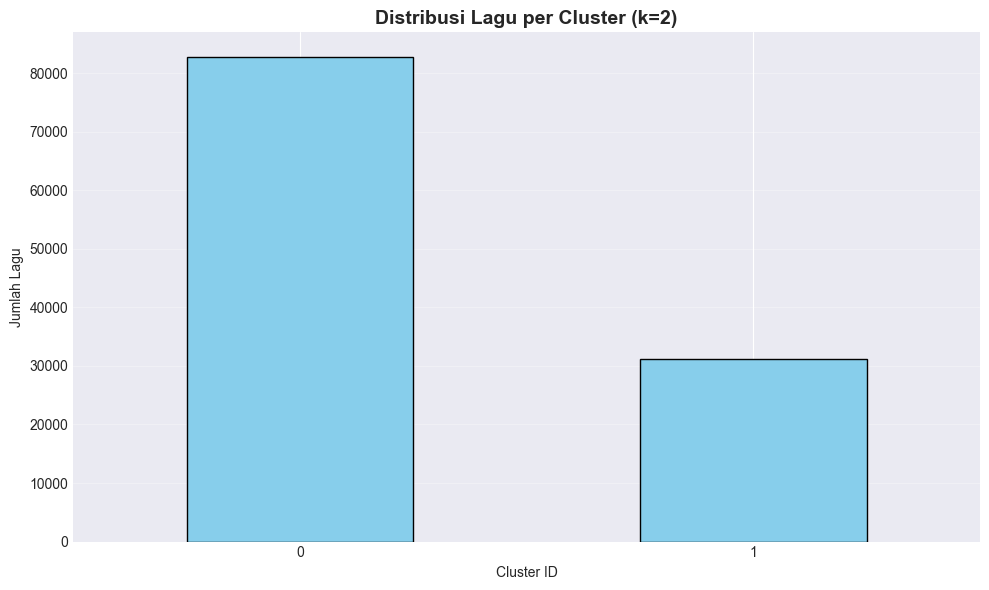

In [26]:
print("=" * 80)
print("🎯 FINAL CLUSTERING MODEL")
print("=" * 80)

# Pilih k optimal berdasarkan silhouette score
optimal_k = eval_df.loc[eval_df['Silhouette Score'].idxmax(), 'k']
print(f"\n✅ Optimal k berdasarkan Silhouette Score: {optimal_k}")

# Fit final model
print(f"\n🔧 Training final K-Means model dengan k={optimal_k}...")
final_kmeans = KMeans(n_clusters=optimal_k, init='k-means++', random_state=42, n_init=10)
cluster_labels = final_kmeans.fit_predict(X_pca)

# Add cluster labels to dataframe
df_clean['Cluster'] = cluster_labels

# Evaluasi final model
final_silhouette = silhouette_score(X_pca, cluster_labels)
final_davies_bouldin = davies_bouldin_score(X_pca, cluster_labels)
final_calinski_harabasz = calinski_harabasz_score(X_pca, cluster_labels)

print(f"\n📊 Final Model Performance:")
print(f"   - Number of Clusters: {optimal_k}")
print(f"   - Silhouette Score: {final_silhouette:.4f}")
print(f"   - Davies-Bouldin Index: {final_davies_bouldin:.4f}")
print(f"   - Calinski-Harabasz Index: {final_calinski_harabasz:.4f}")

# Cluster distribution
print(f"\n📈 Distribusi Cluster:")
cluster_counts = df_clean['Cluster'].value_counts().sort_index()
for cluster_id, count in cluster_counts.items():
    percentage = (count / len(df_clean)) * 100
    print(f"   - Cluster {cluster_id}: {count} lagu ({percentage:.2f}%)")

# Visualisasi distribusi
plt.figure(figsize=(10, 6))
cluster_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title(f'Distribusi Lagu per Cluster (k={optimal_k})', fontsize=14, fontweight='bold')
plt.xlabel('Cluster ID')
plt.ylabel('Jumlah Lagu')
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

<a id='post-clustering-analysis'></a>
## 8. Post-Clustering Visualization & Analysis

Visualisasi hasil clustering dan interpretasi karakteristik setiap cluster.

### 8.1 2D Visualization dengan PCA

Visualisasi cluster dalam ruang 2D menggunakan 2 komponen PCA pertama.

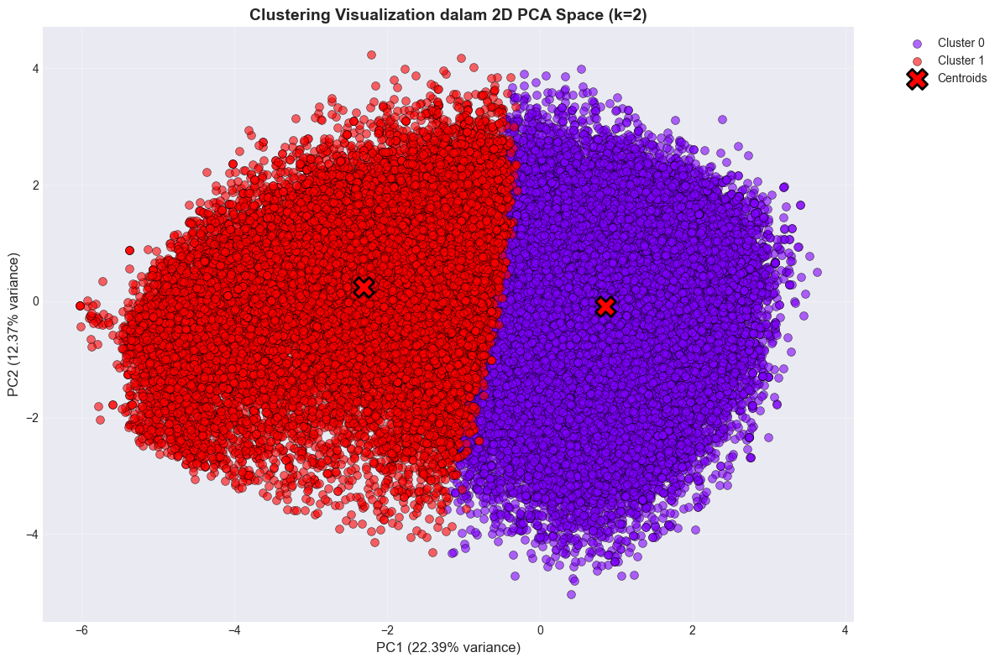

In [27]:
# 2D visualization
plt.figure(figsize=(12, 8))

# Plot each cluster with different color
colors = plt.cm.rainbow(np.linspace(0, 1, optimal_k))
for i in range(optimal_k):
    cluster_data = X_pca[cluster_labels == i]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], 
                c=[colors[i]], label=f'Cluster {i}', 
                alpha=0.6, edgecolors='black', linewidth=0.5, s=50)

# Plot centroids
centroids_pca = final_kmeans.cluster_centers_
plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1], 
            c='red', marker='X', s=300, edgecolors='black', linewidth=2,
            label='Centroids', zorder=10)

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}% variance)', fontsize=12)
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}% variance)', fontsize=12)
plt.title(f'Clustering Visualization dalam 2D PCA Space (k={optimal_k})', 
          fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### 8.2 3D Visualization (Interactive)

Visualisasi interaktif dalam ruang 3D menggunakan 3 komponen PCA pertama.

In [28]:
# 3D Interactive visualization with Plotly
if X_pca.shape[1] >= 3:
    fig = go.Figure()
    
    # Add scatter for each cluster
    for i in range(optimal_k):
        cluster_mask = cluster_labels == i
        fig.add_trace(go.Scatter3d(
            x=X_pca[cluster_mask, 0],
            y=X_pca[cluster_mask, 1],
            z=X_pca[cluster_mask, 2],
            mode='markers',
            name=f'Cluster {i}',
            marker=dict(size=4, opacity=0.6),
            text=[f'Cluster {i}'] * sum(cluster_mask)
        ))
    
    # Add centroids
    fig.add_trace(go.Scatter3d(
        x=centroids_pca[:, 0],
        y=centroids_pca[:, 1],
        z=centroids_pca[:, 2],
        mode='markers',
        name='Centroids',
        marker=dict(size=10, color='red', symbol='diamond', 
                   line=dict(color='black', width=2))
    ))
    
    fig.update_layout(
        title=f'3D Clustering Visualization (k={optimal_k})',
        scene=dict(
            xaxis_title=f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)',
            yaxis_title=f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)',
            zaxis_title=f'PC3 ({pca.explained_variance_ratio_[2]*100:.2f}%)',
        ),
        width=900,
        height=700
    )
    
    fig.show()
else:
    print("⚠️ Tidak cukup komponen PCA untuk visualisasi 3D")

### 8.3 Cluster Characteristics Analysis

Analisis mendalam tentang karakteristik rata-rata setiap cluster berdasarkan fitur audio asli.

🔍 CLUSTER CHARACTERISTICS ANALYSIS

📊 Profil Rata-rata Setiap Cluster:


,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
Cluster,,,,,,,,,,,,,,
0,33.782164,226874.193969,0.597857,0.760701,5.431398,-6.192532,0.608743,0.073831,0.164511,0.024994,0.206795,0.524830,126.432395,4.000000
1,31.794712,210893.210839,0.485047,0.324260,4.984149,-12.592600,0.714144,0.049514,0.714630,0.046760,0.169454,0.339146,110.884940,4.000000


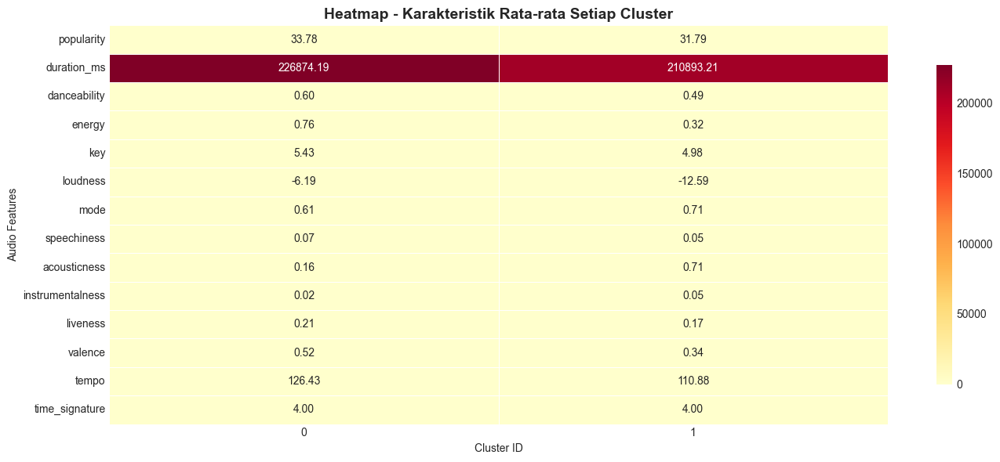

In [29]:
print("=" * 80)
print("🔍 CLUSTER CHARACTERISTICS ANALYSIS")
print("=" * 80)

# Calculate mean values untuk setiap cluster
cluster_profiles = df_clean.groupby('Cluster')[features_for_clustering].mean()

print("\n📊 Profil Rata-rata Setiap Cluster:")
display(cluster_profiles.style.background_gradient(cmap='YlOrRd', axis=1))

# Heatmap untuk cluster profiles
plt.figure(figsize=(14, max(6, optimal_k * 0.8)))
sns.heatmap(cluster_profiles.T, annot=True, fmt='.2f', cmap='YlOrRd', 
            linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.title('Heatmap - Karakteristik Rata-rata Setiap Cluster', fontsize=14, fontweight='bold')
plt.xlabel('Cluster ID')
plt.ylabel('Audio Features')
plt.tight_layout()
plt.show()

### 8.4 Radar Chart untuk Perbandingan Cluster

Membandingkan profil setiap cluster menggunakan radar chart (spider chart).

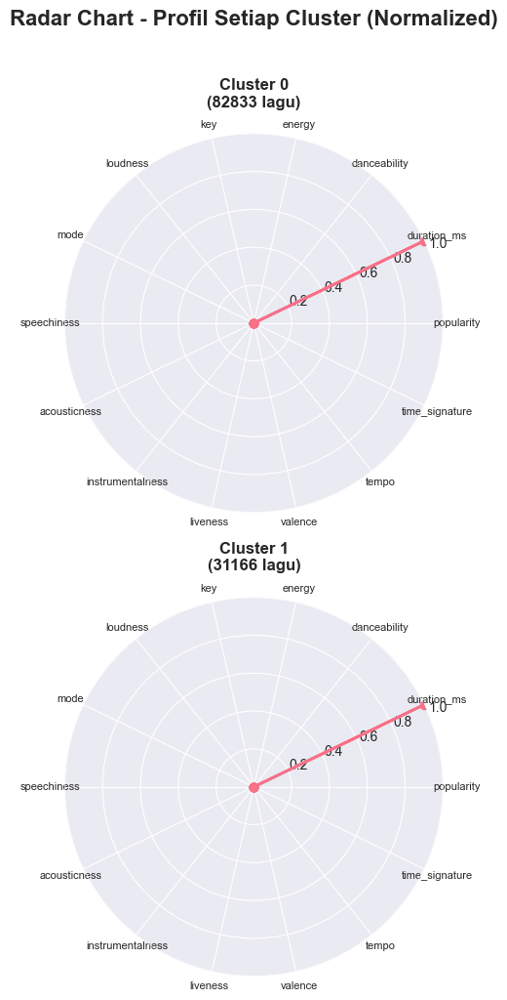

In [30]:
# Normalize cluster profiles untuk radar chart (0-1 scale)
from sklearn.preprocessing import MinMaxScaler
scaler_radar = MinMaxScaler()
cluster_profiles_normalized = pd.DataFrame(
    scaler_radar.fit_transform(cluster_profiles.T).T,
    index=cluster_profiles.index,
    columns=cluster_profiles.columns
)

# Create radar chart untuk setiap cluster
num_features = len(features_for_clustering)
angles = np.linspace(0, 2 * np.pi, num_features, endpoint=False).tolist()
angles += angles[:1]  # Complete the circle

fig, axes = plt.subplots(2, (optimal_k + 1) // 2, figsize=(18, 10), subplot_kw=dict(projection='polar'))
axes = axes.flatten() if optimal_k > 1 else [axes]

for idx, cluster_id in enumerate(range(optimal_k)):
    ax = axes[idx]
    
    values = cluster_profiles_normalized.loc[cluster_id].tolist()
    values += values[:1]  # Complete the circle
    
    ax.plot(angles, values, 'o-', linewidth=2, label=f'Cluster {cluster_id}')
    ax.fill(angles, values, alpha=0.25)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(features_for_clustering, size=8)
    ax.set_ylim(0, 1)
    ax.set_title(f'Cluster {cluster_id}\n({cluster_counts[cluster_id]} lagu)', 
                 fontsize=12, fontweight='bold', pad=20)
    ax.grid(True)

# Hide unused subplots
for idx in range(optimal_k, len(axes)):
    axes[idx].axis('off')

plt.suptitle('Radar Chart - Profil Setiap Cluster (Normalized)', 
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### 8.5 Distribusi Fitur per Cluster (Violin Plot)

Melihat distribusi detail setiap fitur dalam setiap cluster.

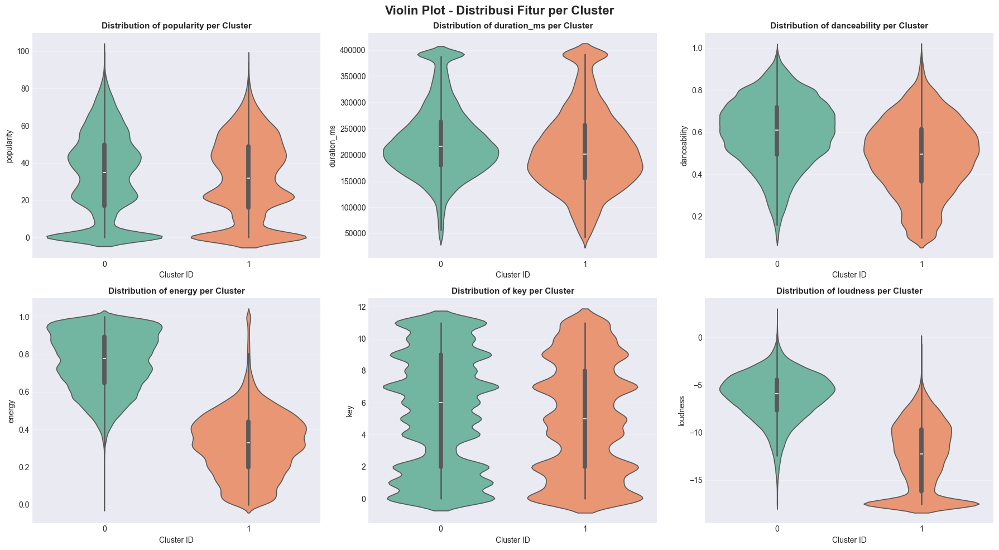

In [31]:
# Violin plots untuk beberapa fitur penting
# Pilih 6 fitur paling menarik (atau semua jika < 6)
features_to_plot = features_for_clustering[:min(6, len(features_for_clustering))]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, feature in enumerate(features_to_plot):
    if idx < len(axes):
        sns.violinplot(data=df_clean, x='Cluster', y=feature, ax=axes[idx], palette='Set2')
        axes[idx].set_title(f'Distribution of {feature} per Cluster', fontsize=11, fontweight='bold')
        axes[idx].set_xlabel('Cluster ID')
        axes[idx].set_ylabel(feature)
        axes[idx].grid(axis='y', alpha=0.3)

# Hide unused subplots
for idx in range(len(features_to_plot), len(axes)):
    axes[idx].axis('off')

plt.suptitle('Violin Plot - Distribusi Fitur per Cluster', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### 8.6 Interpretasi Makna Setiap Cluster

Berdasarkan karakteristik rata-rata, kita beri label deskriptif untuk setiap cluster.

In [32]:
print("=" * 80)
print("🎵 INTERPRETASI MAKNA SETIAP CLUSTER")
print("=" * 80)

# Fungsi untuk memberikan interpretasi berdasarkan karakteristik
def interpret_cluster(cluster_id, profile):
    """Generate interpretasi untuk setiap cluster berdasarkan profil fitur"""
    interpretation = f"\n🎯 CLUSTER {cluster_id} ({cluster_counts[cluster_id]} lagu, {cluster_counts[cluster_id]/len(df_clean)*100:.1f}%)\n"
    interpretation += "=" * 60 + "\n"
    
    # Identifikasi fitur-fitur dengan nilai tinggi dan rendah
    profile_normalized = (profile - cluster_profiles.mean()) / cluster_profiles.std()
    high_features = profile_normalized[profile_normalized > 0.5].sort_values(ascending=False)
    low_features = profile_normalized[profile_normalized < -0.5].sort_values()
    
    # Karakteristik utama (fitur tinggi)
    if len(high_features) > 0:
        interpretation += "\n✅ Karakteristik Menonjol (Tinggi):\n"
        for feat, val in high_features.items():
            interpretation += f"   • {feat}: {profile[feat]:.3f} (z-score: {val:.2f})\n"
    
    # Karakteristik rendah
    if len(low_features) > 0:
        interpretation += "\n❌ Karakteristik Rendah:\n"
        for feat, val in low_features.items():
            interpretation += f"   • {feat}: {profile[feat]:.3f} (z-score: {val:.2f})\n"
    
    # Generate deskripsi musik
    interpretation += "\n🎼 Deskripsi Musik:\n"
    
    # Contoh interpretasi berdasarkan fitur umum Spotify
    descriptions = []
    
    # Energy & Loudness
    if 'energy' in profile.index:
        if profile.get('energy', 0.5) > cluster_profiles['energy'].median():
            descriptions.append("Energetik dan powerful")
        else:
            descriptions.append("Tenang dan relaxed")
    
    # Danceability
    if 'danceability' in profile.index:
        if profile.get('danceability', 0.5) > cluster_profiles['danceability'].median():
            descriptions.append("Cocok untuk menari")
        else:
            descriptions.append("Lebih untuk didengarkan/diapresiasi")
    
    # Valence (mood)
    if 'valence' in profile.index:
        if profile.get('valence', 0.5) > cluster_profiles['valence'].median():
            descriptions.append("Suasana positif/gembira")
        else:
            descriptions.append("Suasana melankolis/serius")
    
    # Acousticness
    if 'acousticness' in profile.index:
        if profile.get('acousticness', 0.5) > cluster_profiles['acousticness'].median():
            descriptions.append("Dominan akustik")
        else:
            descriptions.append("Elektronik/synthesized")
    
    # Tempo
    if 'tempo' in profile.index:
        if profile.get('tempo', 120) > cluster_profiles['tempo'].median():
            descriptions.append("Tempo cepat")
        else:
            descriptions.append("Tempo lambat/sedang")
    
    if descriptions:
        interpretation += "   " + ", ".join(descriptions) + "\n"
    
    return interpretation

# Print interpretasi untuk setiap cluster
for cluster_id in range(optimal_k):
    profile = cluster_profiles.loc[cluster_id]
    print(interpret_cluster(cluster_id, profile))

🎵 INTERPRETASI MAKNA SETIAP CLUSTER

🎯 CLUSTER 0 (82833 lagu, 72.7%)

✅ Karakteristik Menonjol (Tinggi):
   • popularity: 33.782 (z-score: 0.71)
   • tempo: 126.432 (z-score: 0.71)
   • danceability: 0.598 (z-score: 0.71)
   • speechiness: 0.074 (z-score: 0.71)
   • valence: 0.525 (z-score: 0.71)
   • energy: 0.761 (z-score: 0.71)
   • loudness: -6.193 (z-score: 0.71)
   • liveness: 0.207 (z-score: 0.71)
   • duration_ms: 226874.194 (z-score: 0.71)
   • key: 5.431 (z-score: 0.71)

❌ Karakteristik Rendah:
   • mode: 0.609 (z-score: -0.71)
   • acousticness: 0.165 (z-score: -0.71)
   • instrumentalness: 0.025 (z-score: -0.71)

🎼 Deskripsi Musik:
   Energetik dan powerful, Cocok untuk menari, Suasana positif/gembira, Elektronik/synthesized, Tempo cepat


🎯 CLUSTER 1 (31166 lagu, 27.3%)

✅ Karakteristik Menonjol (Tinggi):
   • mode: 0.714 (z-score: 0.71)
   • acousticness: 0.715 (z-score: 0.71)
   • instrumentalness: 0.047 (z-score: 0.71)

❌ Karakteristik Rendah:
   • key: 4.984 (z-score: 

### 8.7 Sample Songs per Cluster

Melihat contoh lagu dari setiap cluster untuk memvalidasi interpretasi.

In [33]:
# Identifikasi kolom untuk info lagu (track name, artist, dll)
info_columns = [col for col in df_clean.columns 
                if any(keyword in col.lower() for keyword in ['track', 'artist', 'name', 'album'])
                and col != 'Cluster']

if len(info_columns) > 0:
    print("=" * 80)
    print("🎵 SAMPLE LAGU DARI SETIAP CLUSTER")
    print("=" * 80)
    
    for cluster_id in range(optimal_k):
        print(f"\n📀 CLUSTER {cluster_id} - Sample (5 lagu pertama):")
        print("-" * 60)
        
        cluster_songs = df_clean[df_clean['Cluster'] == cluster_id]
        sample_cols = info_columns[:3]  # Max 3 kolom info
        
        if len(cluster_songs) > 0:
            sample = cluster_songs[sample_cols].head(5)
            display(sample)
        else:
            print("   (Tidak ada lagu dalam cluster ini)")
else:
    print("ℹ️ Info lagu (track name, artist) tidak tersedia dalam dataset")

🎵 SAMPLE LAGU DARI SETIAP CLUSTER

📀 CLUSTER 0 - Sample (5 lagu pertama):
------------------------------------------------------------


,Unnamed: 0,track_id,artists
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino
5,5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells
7,7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz
8,8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat
14,14,4LbWtBkN82ZRhz9jqzgrb3,Chord Overstreet;Deepend



📀 CLUSTER 1 - Sample (5 lagu pertama):
------------------------------------------------------------


,Unnamed: 0,track_id,artists
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet
6,6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera


### 8.8 Feature Importance Analysis

Menggunakan Random Forest untuk menentukan fitur mana yang paling penting dalam membedakan cluster.

🌳 FEATURE IMPORTANCE ANALYSIS

📊 Feature Importance Rankings:

📊 Feature Importance Rankings:


,Feature,Importance
3,energy,0.344321
8,acousticness,0.250599
5,loudness,0.191987
11,valence,0.045539
7,speechiness,0.040242
2,danceability,0.036764
12,tempo,0.030867
9,instrumentalness,0.015941
1,duration_ms,0.014105
10,liveness,0.012419


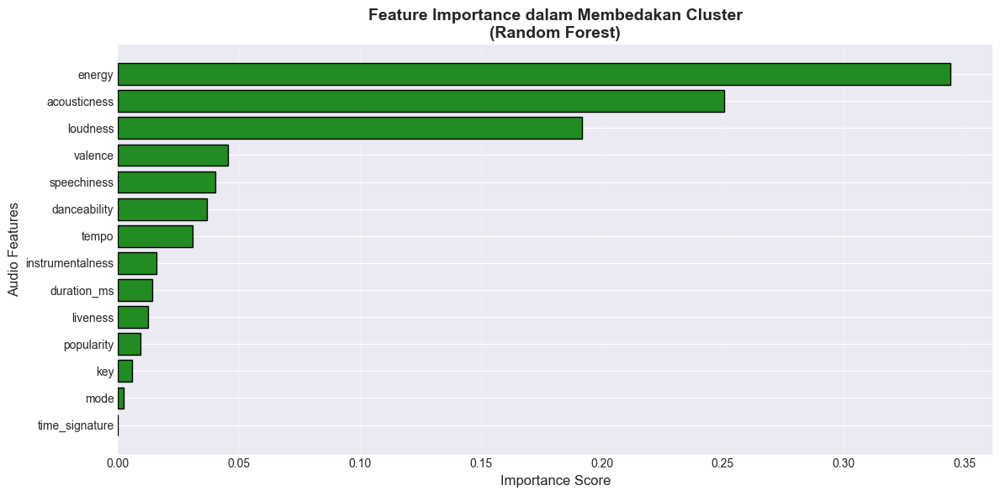


💡 Interpretasi: Fitur dengan importance tinggi adalah yang paling
   berkontribusi dalam membedakan antar cluster.


In [34]:
print("=" * 80)
print("🌳 FEATURE IMPORTANCE ANALYSIS")
print("=" * 80)

# Train Random Forest untuk prediksi cluster
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf_classifier.fit(X_scaled, cluster_labels)

# Feature importance
feature_importance = pd.DataFrame({
    'Feature': features_for_clustering,
    'Importance': rf_classifier.feature_importances_
}).sort_values('Importance', ascending=False)

print("\n📊 Feature Importance Rankings:")
display(feature_importance.style.background_gradient(cmap='Greens', subset=['Importance']))

# Visualisasi
plt.figure(figsize=(12, max(6, len(features_for_clustering) * 0.4)))
plt.barh(feature_importance['Feature'], feature_importance['Importance'], color='forestgreen', edgecolor='black')
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('Audio Features', fontsize=12)
plt.title('Feature Importance dalam Membedakan Cluster\n(Random Forest)', 
          fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

print("\n💡 Interpretasi: Fitur dengan importance tinggi adalah yang paling")
print("   berkontribusi dalam membedakan antar cluster.")

### 8.9 Pairwise Feature Comparison per Cluster

Scatter plot untuk melihat hubungan antar fitur penting dalam setiap cluster.

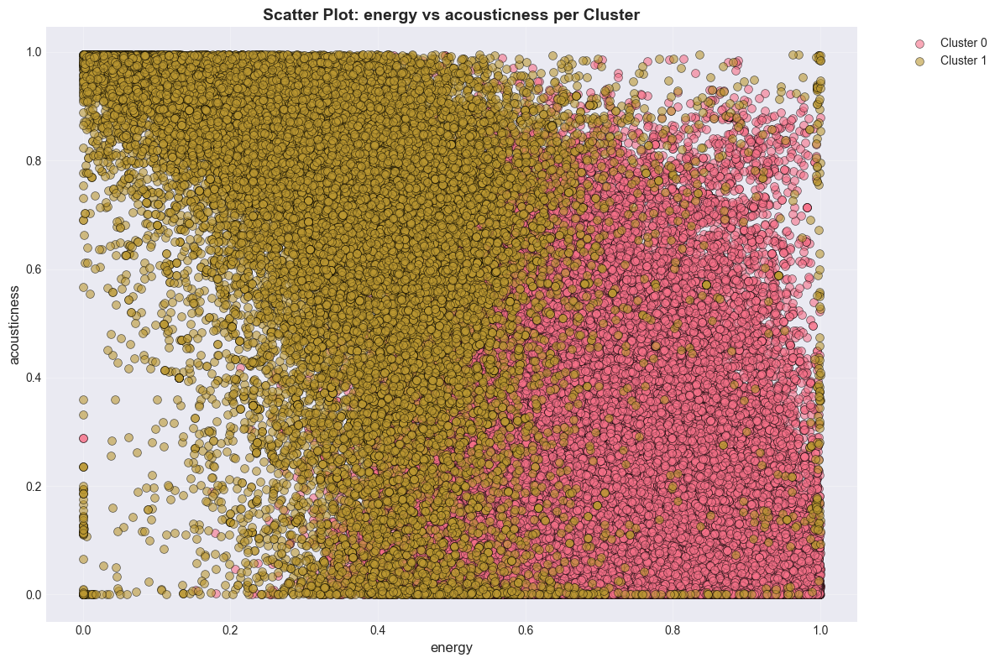

In [35]:
# Pilih 2 fitur paling penting untuk scatter plot
if len(feature_importance) >= 2:
    top_2_features = feature_importance['Feature'].head(2).tolist()
    
    plt.figure(figsize=(12, 8))
    
    for i in range(optimal_k):
        cluster_data = df_clean[df_clean['Cluster'] == i]
        plt.scatter(cluster_data[top_2_features[0]], 
                   cluster_data[top_2_features[1]],
                   label=f'Cluster {i}',
                   alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
    
    plt.xlabel(f'{top_2_features[0]}', fontsize=12)
    plt.ylabel(f'{top_2_features[1]}', fontsize=12)
    plt.title(f'Scatter Plot: {top_2_features[0]} vs {top_2_features[1]} per Cluster', 
              fontsize=14, fontweight='bold')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ Tidak cukup fitur untuk scatter plot")

<a id='conclusion'></a>
## 9. Conclusion & Summary

Ringkasan hasil analisis clustering dan insight yang diperoleh.

In [36]:
print("=" * 80)
print("📝 SUMMARY & CONCLUSION")
print("=" * 80)

print(f"""
🎵 PROJECT SUMMARY
{'='*60}

📊 Dataset Information:
   • Total Songs: {len(df)}
   • Songs after cleaning: {len(df_clean)}
   • Audio Features: {len(features_for_clustering)}

🔬 Dimensionality Reduction:
   • PCA Components: {n_components_optimal}
   • Variance Retained: {cumulative_variance[n_components_optimal-1]:.2%}

🎯 Clustering Results:
   • Algorithm: K-Means
   • Optimal Number of Clusters: {optimal_k}
   • Silhouette Score: {final_silhouette:.4f}
   • Davies-Bouldin Index: {final_davies_bouldin:.4f}
   • Calinski-Harabasz Index: {final_calinski_harabasz:.2f}

📈 Cluster Distribution:
""")

for cluster_id in range(optimal_k):
    count = cluster_counts[cluster_id]
    pct = (count / len(df_clean)) * 100
    print(f"   • Cluster {cluster_id}: {count:,} lagu ({pct:.1f}%)")

print(f"""
🔑 Key Insights:
   • Dataset berhasil dikelompokkan menjadi {optimal_k} cluster yang berbeda
   • Setiap cluster memiliki karakteristik audio yang unik
   • PCA berhasil mengurangi dimensi sambil mempertahankan {cumulative_variance[n_components_optimal-1]:.1%} variance
   • Clustering quality baik dengan Silhouette Score {final_silhouette:.3f}

💡 Aplikasi Praktis:
   • Recommendation System: Merekomendasikan lagu serupa dalam cluster yang sama
   • Playlist Generation: Membuat playlist berdasarkan mood/karakteristik cluster
   • Music Discovery: Membantu pengguna menemukan musik baru dengan karakteristik serupa
   • Genre Analysis: Memahami karakteristik audio dari berbagai jenis musik

📌 Next Steps:
   • Validasi cluster dengan genre aktual (jika tersedia)
   • Eksplorasi algoritma clustering lain (DBSCAN, Hierarchical)
   • Fine-tuning hyperparameter untuk hasil lebih optimal
   • Implementasi recommendation system berbasis cluster

{'='*60}
✅ Analysis Complete!
""")

print("=" * 80)

📝 SUMMARY & CONCLUSION

🎵 PROJECT SUMMARY

📊 Dataset Information:
   • Total Songs: 114000
   • Songs after cleaning: 113999
   • Audio Features: 14

🔬 Dimensionality Reduction:
   • PCA Components: 11
   • Variance Retained: 96.42%

🎯 Clustering Results:
   • Algorithm: K-Means
   • Optimal Number of Clusters: 2
   • Silhouette Score: 0.1761
   • Davies-Bouldin Index: 1.9916
   • Calinski-Harabasz Index: 21973.21

📈 Cluster Distribution:

   • Cluster 0: 82,833 lagu (72.7%)
   • Cluster 1: 31,166 lagu (27.3%)

🔑 Key Insights:
   • Dataset berhasil dikelompokkan menjadi 2 cluster yang berbeda
   • Setiap cluster memiliki karakteristik audio yang unik
   • PCA berhasil mengurangi dimensi sambil mempertahankan 96.4% variance
   • Clustering quality baik dengan Silhouette Score 0.176

💡 Aplikasi Praktis:
   • Recommendation System: Merekomendasikan lagu serupa dalam cluster yang sama
   • Playlist Generation: Membuat playlist berdasarkan mood/karakteristik cluster
   • Music Discovery: Me

### 9.1 Export Results (Optional)

Menyimpan hasil clustering untuk analisis lebih lanjut.

In [37]:
# Uncomment untuk export hasil clustering
# df_clean.to_csv('spotify_songs_clustered.csv', index=False)
# print("✅ Results exported to 'spotify_songs_clustered.csv'")

# Export cluster profiles
# cluster_profiles.to_csv('cluster_profiles.csv')
# print("✅ Cluster profiles exported to 'cluster_profiles.csv'")

print("ℹ️ Uncomment code di atas untuk export hasil clustering")

ℹ️ Uncomment code di atas untuk export hasil clustering


---

## 🎉 End of Notebook

Terima kasih telah mengikuti analisis clustering ini! 

**Notebook ini mencakup:**
- ✅ Data Loading & Description
- ✅ Comprehensive EDA
- ✅ Data Preprocessing (Missing values, Duplicates, Outliers)
- ✅ PCA & Feature Selection
- ✅ Multiple Clustering Evaluation Metrics
- ✅ Optimal K-Means Clustering
- ✅ Rich Visualizations (2D, 3D, Radar, Violin, Heatmap)
- ✅ Detailed Cluster Interpretation
- ✅ Feature Importance Analysis

**Untuk pertanyaan atau saran, silakan hubungi!** 🚀